## TOPSIS

En este jupyter se estudiará el algoritmo de TOPSIS, el cual se puede utilizar para rankear un conjunto de datos, en base a las preferencias de un usuario.

Para tener datos reales, tengo la información de las viviendas en Santiago de Yapo (un portal inmobliario en Chile). Estas vivientas son todoa los departamentos en venta y en arriendo de la region metropilitana. Este codigo no podra ser ejecutado por otra persona, ya que se necesita acceso a la base de datos de las viviendas, pero es una muestra de como poder utilizar esta metodologia.

Si conocen otro algoritmo, feliz de saber como hacerlo.

In [16]:
import pandas as pd
from markitdown import MarkItDown
from openai import OpenAI
import re
import json
import os
import logging
import math
from dotenv import load_dotenv
from supabase import create_client, Client

load_dotenv()

class SupaBaseClient:
    def __init__(self):
        self.supabase_url = os.getenv("SUPABASE_URL")
        self.supabase_key = os.getenv("SUPABASE_KEY")        
        # Check if credentials are available
        if not self.supabase_url or not self.supabase_key:
            logging.warning("Supabase credentials not found in environment variables. Database operations will be skipped.")
            return
            
        try:
            self.supabase = create_client(self.supabase_url, self.supabase_key)
            logging.info("Supabase client initialized successfully")
        except Exception as e:
            logging.error(f"Failed to initialize Supabase client: {str(e)}")

    def save_record(self, table_name: str, record: dict) -> dict:
        """
        Save a record to a Supabase table
        
        Args:
            table_name (str): The name of the table to save the record to
            record (dict): The record to save
            
        Returns:
            dict: The saved record with its ID
        """
        if not self.supabase:
            logging.warning(f"Skipping save to {table_name}: Supabase client not initialized")
            return record  # Return the original record without saving
            
        try:
            # Sanitize record to ensure it's JSON compliant
            sanitized_record = self.sanitize_json_data(record)
            response = self.supabase.table(table_name).insert(sanitized_record).execute()
            return response.data[0] if response.data else None
        except Exception as e:
            logging.error(f"Error saving record to {table_name}: {str(e)}")
            print(e)
            return None

    def sanitize_json_data(self, data):
        """
        Sanitize data to ensure it's JSON compliant
        
        Args:
            data: The data to sanitize (dict, list, or primitive value)
            
        Returns:
            The sanitized data that is JSON compliant
        """
        if isinstance(data, dict):
            return {k: self.sanitize_json_data(v) for k, v in data.items()}
        elif isinstance(data, list):
            return [self.sanitize_json_data(item) for item in data]
        elif isinstance(data, float):
            # Handle NaN, Infinity, and extremely large floats
            if math.isnan(data) or math.isinf(data) or abs(data) > 1e15:
                return str(data)  # Convert problematic floats to strings
            return data
        else:
            return data
            
    def save_records(self, table_name: str, records: list) -> list:
        """
        Save multiple records to a Supabase table
        
        Args:
            table_name (str): The name of the table to save the records to
            records (list): A list of records to save
            
        Returns:
            list: The saved records with their IDs
        """
        if not self.supabase:
            logging.warning(f"Skipping save to {table_name}: Supabase client not initialized")
            return records  # Return the original records without saving
            
        try:
            # Sanitize records to ensure they're JSON compliant
            sanitized_records = self.sanitize_json_data(records)
            response = self.supabase.table(table_name).insert(sanitized_records).execute()
            return response.data if response.data else []
        except Exception as e:
            logging.error(f"Error saving records to {table_name}: {str(e)}")
            return []

    def get_all_records(self, table_name: str, batch_size=1000) -> list:
        """
        Retrieve all records from a Supabase table (auto-pagination).
        
        Args:
            table_name (str): The name of the table to query
            batch_size (int): Number of rows to fetch per batch (default 1000)
            
        Returns:
            list: All records from the table
        """
        if not self.supabase:
            logging.warning(f"Skipping fetch from {table_name}: Supabase client not initialized")
            return []

        all_records = []
        start = 0
        
        try:
            while True:
                response = self.supabase.table(table_name).select("*").range(start, start + batch_size - 1).execute()
                data = response.data
                if not data:  # Stop when no more rows are returned
                    break
                
                all_records.extend(data)
                start += batch_size  # Move to the next batch

            logging.info(f"Fetched {len(all_records)} records from {table_name}")
            return all_records

        except Exception as e:
            logging.error(f"Error fetching records from {table_name}: {str(e)}")
            return []

## Datos desde Supabase

Desde una base de datos, extraigo los datos de las viviendas en Santiago tanto que estan a la venta, como en arriendo. Esta informacion fue extraida mediante webscrapping, usando el sitio de yapo.

In [17]:
class_supabase = SupaBaseClient()
records = class_supabase.get_all_records("master_table_ml")
df = pd.DataFrame(records)

In [18]:
df.head()

,ref_id,comuna,url,type_house,type_property,type_usage_property,type_location,latitude,longitude,web,...,elevator,laundry_rooms,swimming_pool,multiused_room,gym_room,distance_subway,closest_subway_m2,total_price,public_date,created_date
0,31141315,Lo Barnechea,https://www.yapo.cl/bienes-raices-alquiler-apa...,alquiler,apartamentos,,Lo Barnechea,-33.359670,-70.521322,yapo,...,0,0,1,0,1,5778.404529,0,1573957.60,2025-08-09,2025-08-28
1,30958407,Lo Barnechea,https://www.yapo.cl/bienes-raices-alquiler-apa...,alquiler,apartamentos,,Lo Barnechea,-33.349647,-70.546634,yapo,...,0,0,0,0,0,6461.431815,0,1888749.12,2025-07-07,2025-08-28
2,31136095,Lo Barnechea,https://www.yapo.cl/bienes-raices-alquiler-apa...,alquiler,apartamentos,,Lo Barnechea,-33.368552,-70.507180,yapo,...,0,0,0,0,0,5595.940787,0,1298515.02,2025-08-08,2025-08-28
3,31080901,Lo Barnechea,https://www.yapo.cl/bienes-raices-alquiler-apa...,alquiler,apartamentos,,Lo Barnechea,-33.363320,-70.520908,yapo,...,0,0,1,0,1,5421.700016,0,3462706.72,2025-07-29,2025-08-28
4,30921513,Lo Barnechea,https://www.yapo.cl/bienes-raices-alquiler-apa...,alquiler,apartamentos,,Lo Barnechea,-33.351833,-70.511329,yapo,...,0,0,1,0,1,6955.190896,0,1377212.90,2025-06-30,2025-08-28


In [19]:
df.columns

Index(['ref_id', 'comuna', 'url', 'type_house', 'type_property',
       'type_usage_property', 'type_location', 'latitude', 'longitude', 'web',
       'h3_center', 'res', 'n_of_rooms_processed', 'n_of_bathrooms_processed',
       'n_of_parking_spaces_processed', 'n_of_storage_rooms_processed',
       'common_expenses_processed', 'expenditure_of_contributions_processed',
       'total_m2_usage_processed', 'furnished', 'terrace', 'elevator',
       'laundry_rooms', 'swimming_pool', 'multiused_room', 'gym_room',
       'distance_subway', 'closest_subway_m2', 'total_price', 'public_date',
       'created_date'],
      dtype='object')

In [20]:
df['type_house'].value_counts()

type_house
venta       15252
alquiler     6635
Name: count, dtype: int64

In [21]:
df_sales = df.loc[df['type_house'] == 'venta']
df_sales.head(5)

,ref_id,comuna,url,type_house,type_property,type_usage_property,type_location,latitude,longitude,web,...,elevator,laundry_rooms,swimming_pool,multiused_room,gym_room,distance_subway,closest_subway_m2,total_price,public_date,created_date
6635,31100751,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.406066,-70.569679,yapo,...,0,0,0,0,1,360.245936,1,500164989.0,2025-08-27,2025-08-31
6636,30942843,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.416889,-70.555791,yapo,...,0,0,0,0,0,1018.031879,1,291434718.0,2025-08-27,2025-08-31
6637,31235828,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.400797,-70.562890,yapo,...,0,0,1,0,1,952.976012,1,456843612.0,2025-08-27,2025-08-31
6638,31236440,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.401930,-70.578570,yapo,...,1,1,1,1,0,1236.539183,0,385954086.0,2025-08-27,2025-08-31
6639,31235918,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.416681,-70.588923,yapo,...,0,0,0,0,0,162.645011,1,559239594.0,2025-08-27,2025-08-31


In [22]:
df_sales.reset_index(drop=True, inplace=True)

In [23]:
df_sales

,ref_id,comuna,url,type_house,type_property,type_usage_property,type_location,latitude,longitude,web,...,elevator,laundry_rooms,swimming_pool,multiused_room,gym_room,distance_subway,closest_subway_m2,total_price,public_date,created_date
0,31100751,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.406066,-70.569679,yapo,...,0,0,0,0,1,360.245936,1,500164989.0,2025-08-27,2025-08-31
1,30942843,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.416889,-70.555791,yapo,...,0,0,0,0,0,1018.031879,1,291434718.0,2025-08-27,2025-08-31
2,31235828,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.400797,-70.562890,yapo,...,0,0,1,0,1,952.976012,1,456843612.0,2025-08-27,2025-08-31
3,31236440,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.401930,-70.578570,yapo,...,1,1,1,1,0,1236.539183,0,385954086.0,2025-08-27,2025-08-31
4,31235918,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.416681,-70.588923,yapo,...,0,0,0,0,0,162.645011,1,559239594.0,2025-08-27,2025-08-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15247,30766304,Quilicura,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Quilicura,-33.362639,-70.723456,yapo,...,0,1,1,0,0,7419.558501,0,105900000.0,2025-05-31,2025-08-31
15248,30579075,Quilicura,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Quilicura,-33.351982,-70.721660,yapo,...,0,1,1,0,0,7660.933977,0,118149210.0,2025-04-27,2025-08-31
15249,28556902,Quilicura,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Quilicura,-33.363187,-70.722663,yapo,...,0,1,1,0,0,7332.529076,0,113000000.0,2024-07-26,2025-08-31
15250,28609715,Quilicura,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Quilicura,-33.356721,-70.746699,yapo,...,0,0,0,0,0,9679.338363,0,68900000.0,2024-07-31,2025-08-31


**Datos Geograficos**

In [24]:
import folium
from folium.plugins import Fullscreen, MiniMap, MousePosition
import pandas as pd
import numpy as np

# df: your full dataset already loaded
# it must have 'latitude' and 'longitude' columns

# 1) clean rows without coordinates
df_map = df_sales.copy()
df_map = df_map[pd.to_numeric(df_map['latitude'], errors='coerce').notna() &
                pd.to_numeric(df_map['longitude'], errors='coerce').notna()]

# 2) center map on the median coords (works for whole Chile or mixed cities)
center_lat = float(np.median(df_map['latitude']))
center_lon = float(np.median(df_map['longitude']))

# 3) map with canvas (important for performance)
m = folium.Map(
    location=[center_lat, center_lon],
    zoom_start=6,                 # adjust if you want tighter default view
    tiles="CartoDB positron",
    control_scale=True,
    prefer_canvas=True            # << key for fast rendering
)

# nice helpers
Fullscreen().add_to(m)
MiniMap(toggle_display=True).add_to(m)
MousePosition(
    position='bottomright',
    separator=' | ',
    prefix='Lat/Lon',
    num_digits=6
).add_to(m)

# 4) add ALL points as small canvas circle markers (fast + clean)
# keep popups off by default; tooltip is light-weight
# if you *really* need popups, enable them for a sample or on-demand
for r in df_map.itertuples(index=False):
    folium.CircleMarker(
        location=[float(r.latitude), float(r.longitude)],
        radius=2,             # small dot works best at scale
        fill=True,
        fill_opacity=0.6,
        opacity=0,            # no stroke for speed/clarity
        # OPTIONAL: light tooltip (cheap). Comment out to maximize perf.
        tooltip=f"{getattr(r, 'comuna', '')} | {getattr(r, 'type_property', '')}"
    ).add_to(m)

# 5) display directly in Jupyter
m


**Distribuición por comuna**

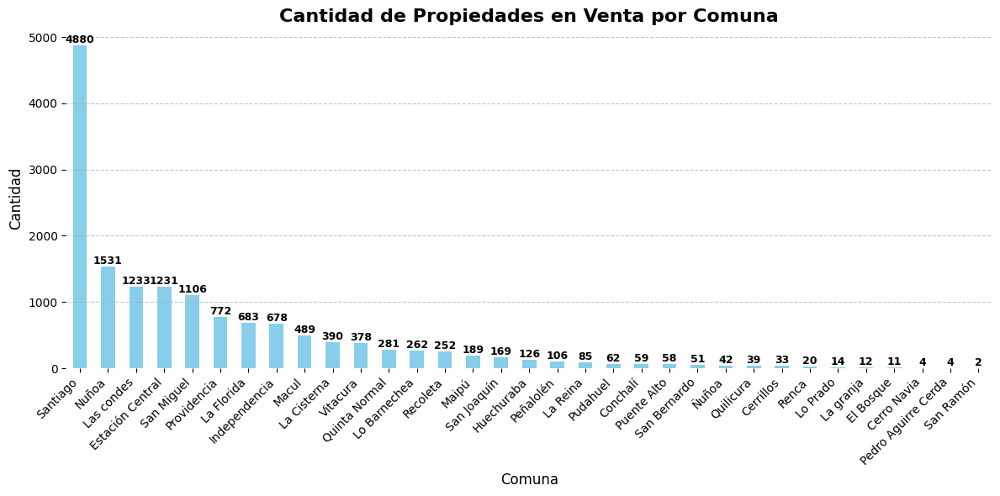

In [25]:
import matplotlib.pyplot as plt

# Agrupar y contar
df_rent_by_comuna = (
    df_sales.groupby('comuna')['total_price']
    .count()
    .sort_values(ascending=False)
)

# Crear figura
fig, ax = plt.subplots(figsize=(12, 6))
bars = df_rent_by_comuna.plot(kind='bar', ax=ax, color='skyblue', edgecolor='none')

# Títulos y etiquetas
ax.set_title('Cantidad de Propiedades en Venta por Comuna', fontsize=16, weight='bold')
ax.set_xlabel('Comuna', fontsize=12)
ax.set_ylabel('Cantidad', fontsize=12)

# Rotar etiquetas del eje X
plt.xticks(rotation=45, ha='right')

# Añadir etiquetas de valores encima de las barras
for i, value in enumerate(df_rent_by_comuna):
    ax.text(i, value + 0.5, str(value), ha='center', va='bottom',
            fontsize=9, weight='bold', color='black')

# Grid elegante
ax.grid(axis='y', linestyle='--', alpha=0.7)

# ---- Quitar marco (spines) ----
for spine in ax.spines.values():
    spine.set_visible(False)

plt.tight_layout()
plt.show()



**Precio Pronedio Arriendo por comuna**

In [26]:
df['type_house'].value_counts()

type_house
venta       15252
alquiler     6635
Name: count, dtype: int64

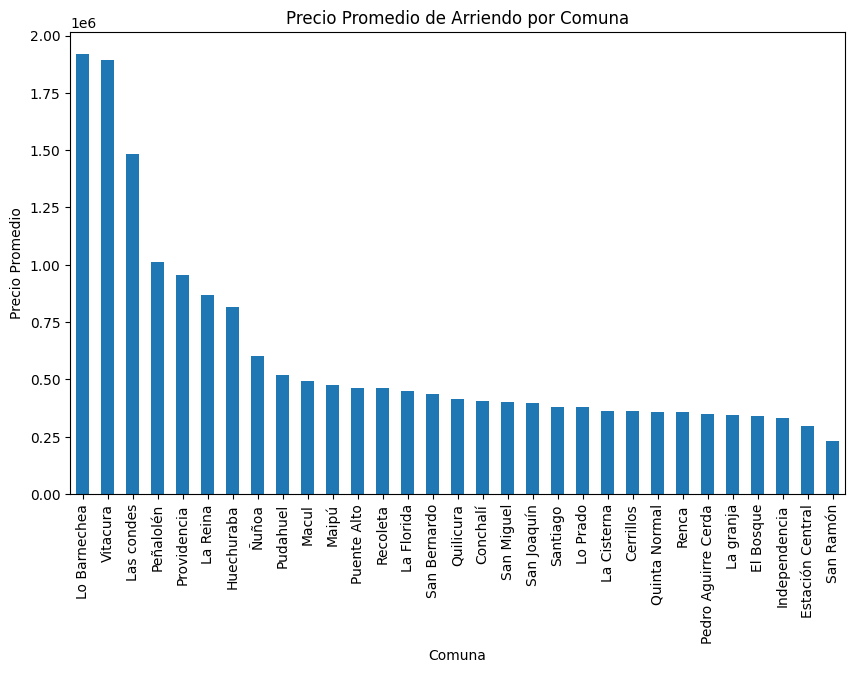

In [27]:
import matplotlib.pyplot as plt

df_rent = df.loc[df['type_house'] == 'alquiler']
df_rent_by_comuna = df_rent.groupby('comuna')['total_price'].mean().sort_values(ascending=False)
df_rent_by_comuna.plot(kind='bar', figsize=(10, 6))
plt.title('Precio Promedio de Arriendo por Comuna')
plt.xlabel('Comuna')
plt.ylabel('Precio Promedio')
plt.show()

In [28]:
df_rent_by_comuna = df_rent_by_comuna.reset_index()

In [29]:
df_rent_by_comuna.head()

,comuna,total_price
0,Lo Barnechea,1.919651e+06
1,Vitacura,1.892329e+06
2,Las condes,1.485354e+06
3,Peñalolén,1.013814e+06
4,Providencia,9.560617e+05


In [30]:
df_sales = df_sales.reset_index()

In [33]:
df_sales['rent_price'] = None

for index in range(len(df_sales)):
    comuna = df_sales['comuna'][index]

    df_rent_by_comuna_row = df_rent_by_comuna.loc[df_rent_by_comuna['comuna'] == comuna]
    if not df_rent_by_comuna_row.empty:
        df_sales.loc[index, 'rent_price'] = df_rent_by_comuna_row['total_price'].values[0]
    else:
        df_sales.loc[index, 'rent_price'] = df_rent_by_comuna['total_price'].mean()

df_sales

,index,ref_id,comuna,url,type_house,type_property,type_usage_property,type_location,latitude,longitude,...,laundry_rooms,swimming_pool,multiused_room,gym_room,distance_subway,closest_subway_m2,total_price,public_date,created_date,rent_price
0,0,31100751,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.406066,-70.569679,...,0,0,0,1,360.245936,1,500164989.0,2025-08-27,2025-08-31,1485354.104764
1,1,30942843,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.416889,-70.555791,...,0,0,0,0,1018.031879,1,291434718.0,2025-08-27,2025-08-31,1485354.104764
2,2,31235828,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.400797,-70.562890,...,0,1,0,1,952.976012,1,456843612.0,2025-08-27,2025-08-31,1485354.104764
3,3,31236440,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.401930,-70.578570,...,1,1,1,0,1236.539183,0,385954086.0,2025-08-27,2025-08-31,1485354.104764
4,4,31235918,Las condes,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Las condes,-33.416681,-70.588923,...,0,0,0,0,162.645011,1,559239594.0,2025-08-27,2025-08-31,1485354.104764
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15247,15247,30766304,Quilicura,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Quilicura,-33.362639,-70.723456,...,1,1,0,0,7419.558501,0,105900000.0,2025-05-31,2025-08-31,414904.761905
15248,15248,30579075,Quilicura,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Quilicura,-33.351982,-70.721660,...,1,1,0,0,7660.933977,0,118149210.0,2025-04-27,2025-08-31,414904.761905
15249,15249,28556902,Quilicura,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Quilicura,-33.363187,-70.722663,...,1,1,0,0,7332.529076,0,113000000.0,2024-07-26,2025-08-31,414904.761905
15250,15250,28609715,Quilicura,https://www.yapo.cl/bienes-raices-venta-de-pro...,venta,de-propiedades-apartamentos,,Quilicura,-33.356721,-70.746699,...,0,0,0,0,9679.338363,0,68900000.0,2024-07-31,2025-08-31,414904.761905


**Scala Logaritmica de los Precios**

Mediana (P50): 114,210,903
P95: 453,933,203
P99: 607,464,163
Ratio P95 / P50: 3.97


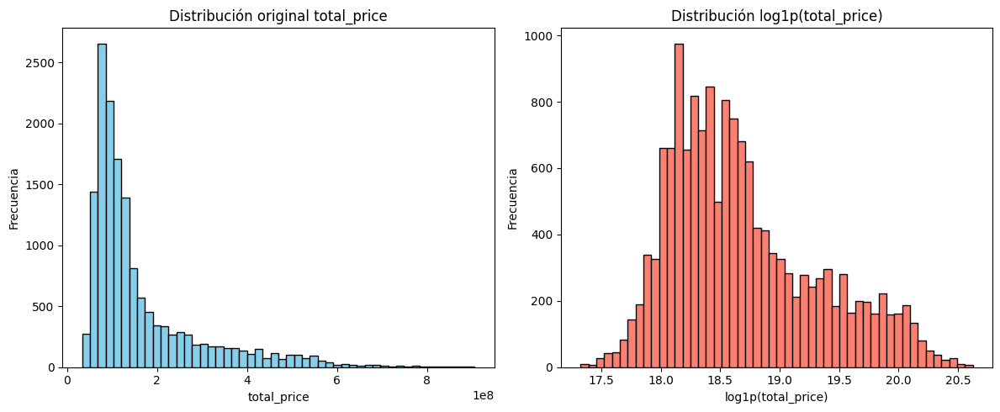

In [34]:
import matplotlib.pyplot as plt
import numpy as np

# Suponiendo que ya tienes tu DataFrame df con la columna total_price
col = pd.to_numeric(df_sales["total_price"], errors="coerce").dropna()

# Percentiles clave
p50 = np.percentile(col, 50)   # mediana
p95 = np.percentile(col, 95)   # percentil 95
p99 = np.percentile(col, 99)   # percentil 99

print(f"Mediana (P50): {p50:,.0f}")
print(f"P95: {p95:,.0f}")
print(f"P99: {p99:,.0f}")
print(f"Ratio P95 / P50: {p95/p50:.2f}")

# Histograma en escala normal
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.hist(col, bins=50, color="skyblue", edgecolor="black")
plt.title("Distribución original total_price")
plt.xlabel("total_price")
plt.ylabel("Frecuencia")

# Histograma en escala logarítmica
plt.subplot(1,2,2)
plt.hist(np.log1p(col), bins=50, color="salmon", edgecolor="black")
plt.title("Distribución log1p(total_price)")
plt.xlabel("log1p(total_price)")
plt.ylabel("Frecuencia")

plt.tight_layout()
plt.show()


**TOPSIS (Technique for Order Preference by Similarity to Ideal Solution)**

TOPSIS es una metodologia que buscar ordenar alternativas en funcion de multiples criterios, asignado un score de cercania relativa. Esta logica consigna los siguiente puntos.
   1-Ideal Positivo: La mejor alternativa posible. (Mayor beneficio, menor costo).
   2-Ideal Negativo: La peor alternativa posible. (Menor beneficio, mayor costo).
La alternativa preferida es la que esta más cerca  al ideal positivo y más lejos del ideal negativo.



In [50]:
import sys
import os
import pandas as pd
from markitdown import MarkItDown
from openai import OpenAI
import re
from dotenv import load_dotenv
from os import getenv
import os
from datetime import datetime
import logging
import time
import concurrent.futures
import random
import threading
from bs4 import BeautifulSoup
import time
import asyncio
import math
import requests
from datetime import date
import re
import numpy as np
import pandas as pd

load_dotenv()

# Create a lock for thread-safe printing
print_lock = threading.Lock()

def _minmax_scale(col: pd.Series) -> pd.Series:
    cmin, cmax = col.min(), col.max()
    if pd.isna(cmin) or pd.isna(cmax) or cmax == cmin:
        return pd.Series(0.0, index=col.index)
    return (col - cmin) / (cmax - cmin)

def add_facilities_count(df: pd.DataFrame, facility_cols, new_col="facilities_count"):
    df = df.copy()
    df[new_col] = df[facility_cols].astype(float).sum(axis=1)
    return df

def rank_properties(
    df: pd.DataFrame,
    criteria,
    weights=None,
    cost_criteria=None,
    method="topsis",
    top_k=5,
    return_all=False,
    score_col="score"
):
    cost_criteria = set(cost_criteria or [])
    # numeric + normalize
    scaled = {}
    for c in criteria:
        col = pd.to_numeric(df[c], errors="coerce")
        s = _minmax_scale(col)
        if c in cost_criteria:
            s = 1 - s
        scaled[c] = s
    M = pd.DataFrame(scaled, index=df.index)
    # weights
    if weights is None:
        w = np.array([1/len(criteria)]*len(criteria))
    else:
        w = np.array([weights[c] for c in criteria], dtype=float)
        w = w / w.sum()
    # method
    if method == "weighted":
        scores = (M.values * w.reshape(1, -1)).sum(axis=1)
    elif method == "topsis":
        V = M.values * w.reshape(1, -1)
        ideal = V.max(axis=0); nideal = V.min(axis=0)
        d_pos = np.linalg.norm(V - ideal, axis=1)
        d_neg = np.linalg.norm(V - nideal, axis=1)
        scores = d_neg / (d_pos + d_neg + 1e-12)
    else:
        raise ValueError("method must be 'weighted' or 'topsis'")
    out = df.copy()
    out[score_col] = scores
    out = out.sort_values(score_col, ascending=False).reset_index(drop=True)
    return out if return_all else out.head(top_k)


# =========================
# Helper functions (no imports needed)
# =========================
def _minmax_scale(col: pd.Series) -> pd.Series:
    cmin, cmax = col.min(), col.max()
    if pd.isna(cmin) or pd.isna(cmax) or cmax == cmin:
        # constant or all-missing -> neutral column
        return pd.Series(0.0, index=col.index)
    return (col - cmin) / (cmax - cmin)

def rank_properties(
    df: pd.DataFrame,
    criteria,
    weights=None,
    cost_criteria=None,
    method="topsis",
    top_k=5,
    return_all=False,
    score_col="score"
):
    """
    Ranks df rows over 'criteria' using either:
      - method='weighted'  -> weighted sum on normalized criteria
      - method='topsis'    -> TOPSIS closeness to ideal solution

    NOTES:
    - Automatically min–max normalizes to [0,1].
    - For cost criteria (lower=better), it inverts after scaling -> 1 - scaled.
    - Non-numeric values are coerced to NaN before scaling.
    """
    cost_criteria = set(cost_criteria or [])

    # Normalize each criterion; convert to numeric first
    scaled = {}
    for c in criteria:
        col = pd.to_numeric(df[c], errors="coerce")
        s = _minmax_scale(col)
        if c in cost_criteria:
            s = 1 - s  # lower cost -> higher score
        scaled[c] = s

    M = pd.DataFrame(scaled, index=df.index)

    # Weights (equal if not provided)
    if weights is None:
        w = np.array([1.0/len(criteria)] * len(criteria))
    else:
        w = np.array([weights[c] for c in criteria], dtype=float)
        w = w / w.sum()

    if method == "weighted":
        scores = (M.values * w.reshape(1, -1)).sum(axis=1)

    elif method == "topsis":
        V = M.values * w.reshape(1, -1)
        ideal = V.max(axis=0)   # best per criterion
        nideal = V.min(axis=0)  # worst per criterion
        d_pos = np.linalg.norm(V - ideal, axis=1)
        d_neg = np.linalg.norm(V - nideal, axis=1)
        scores = d_neg / (d_pos + d_neg + 1e-12)  # closeness

    else:
        raise ValueError("method must be 'weighted' or 'topsis'")

    out = df.copy()
    out[score_col] = scores
    out = out.sort_values(score_col, ascending=False).reset_index(drop=True)
    return out if return_all else out.head(top_k)


def ranker(
    df: pd.DataFrame,
    with_log_scale: bool = False,
    top_k: int = 5,
):
    """
    Rankea propiedades con TOPSIS. Si `with_log_scale=True`, transforma
    `total_price` y `rent_price` con log1p antes del escalado (como COST).

    Params
    ------
    df : DataFrame con columnas requeridas
    with_log_scale : bool -> aplicar log1p a columnas de precios
    top_k : int -> tamaño del top-k si luego quisieras return_all=False
    """

    # --- 0) Chequeo rápido ---
    if df.empty:
        print("Warning: No properties found after applying filters")
        return {"ranked_all": pd.DataFrame()}

    # --- 1) Selección de columnas de trabajo ---
    columns = [
        'n_of_rooms_processed',
        'n_of_bathrooms_processed',
        'n_of_parking_spaces_processed',
        'n_of_storage_rooms_processed',
        'total_m2_usage_processed',
        'furnished',
        'terrace',
        'elevator',
        'laundry_rooms',
        'swimming_pool',
        'multiused_room',
        'gym_room',
        'distance_subway',
        'closest_subway_m2',
        'total_price',
        'public_date',
        'url',
        'rent_price'
    ]
    df = df[columns].copy()

    # --- 2) Limpieza / tipado ---
    # binarios 0/1
    for c in ["terrace","laundry_rooms","swimming_pool","multiused_room","gym_room"]:
        if df[c].dtype == "O":
            df[c] = (df[c].astype(str).str.strip().str.lower()
                     .map({"true":1,"1":1,"yes":1,"si":1,"sí":1,"y":1,"t":1,
                           "false":0,"0":0,"no":0,"n":0}))
        df[c] = pd.to_numeric(df[c], errors="coerce").fillna(0).astype(float)

    # numéricos
    num_cols = [
        "n_of_rooms_processed",
        "n_of_bathrooms_processed",
        "n_of_parking_spaces_processed",
        "n_of_storage_rooms_processed",
        "total_m2_usage_processed",
        "distance_subway",
        "closest_subway_m2",
        "total_price",
        "rent_price"
    ]
    for c in num_cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")

    # fechas -> days_since_publication (COST)
    df["public_date"] = pd.to_datetime(df["public_date"], errors="coerce", utc=True)
    max_date = df["public_date"].max()
    df["days_since_publication"] = (max_date - df["public_date"]).dt.days
    df["days_since_publication"] = df["days_since_publication"].fillna(
        df["days_since_publication"].max()
    )

    # esenciales
    df["total_m2_usage_processed"] = df["total_m2_usage_processed"].replace({0: np.nan})
    df = df.dropna(subset=["total_price","total_m2_usage_processed"])

    # --- 3) Posible transformación log ---
    # Si activas log, creamos columnas *_t y las usamos en criteria/costs/pesos
    if with_log_scale:
        df["total_price_t"] = np.log1p(df["total_price"].clip(lower=0))
        df["rent_price_t"]  = np.log1p(df["rent_price"].clip(lower=0))
        price_col = "total_price_t"
        rent_col  = "rent_price_t"
    else:
        price_col = "total_price"
        rent_col  = "rent_price"

    # --- 4) Criterios / costos / pesos ---
    criteria = [
        price_col,                      # COST
        "total_m2_usage_processed",     # BENEFIT
        "n_of_rooms_processed",         # BENEFIT
        "n_of_bathrooms_processed",     # BENEFIT
        "n_of_parking_spaces_processed",# BENEFIT
        "n_of_storage_rooms_processed", # BENEFIT
        "terrace","laundry_rooms","swimming_pool","multiused_room","gym_room",
        "distance_subway",              # COST
        "closest_subway_m2",            # COST (si es distancia)
        "days_since_publication",       # COST
        rent_col                        # COST
    ]

    cost_criteria = [
        price_col,
        "distance_subway",
        "days_since_publication",
        rent_col
    ]

    # pesos: mapea nombre dinámico (price_col / rent_col)
    weights_base = {
        "total_price": 0.3,
        "total_m2_usage_processed": 0.25,
        "n_of_rooms_processed": 0.12,
        "n_of_bathrooms_processed": 0.03,
        "n_of_parking_spaces_processed": 0.03,
        "n_of_storage_rooms_processed": 0.03,
        "terrace": 0.01,
        "laundry_rooms": 0.01,
        "swimming_pool": 0.01,
        "multiused_room": 0.01,
        "gym_room": 0.01,
        "distance_subway": 0.06,
        "closest_subway_m2": 0.03,
        "days_since_publication": 0.05,
        "rent_price": 0.05
    }
    # adaptar claves si usamos *_t
    weights = {}
    for k, v in weights_base.items():
        if k == "total_price":
            weights[price_col] = v
        elif k == "rent_price":
            weights[rent_col] = v
        else:
            weights[k] = v

    # --- 5) Rank con TOPSIS (usa tu rank_properties existente) ---
    ranked_all = rank_properties(
        df,
        criteria=criteria,
        weights=weights,
        cost_criteria=cost_criteria,
        method="topsis",
        top_k=top_k,
        return_all=True,
        score_col="topsis_score"
    )

    return {"ranked_all": ranked_all}


In [51]:
df_sales['public_date'].max() 

'2025-08-28'

In [52]:
df_last_3_months = df_sales[df_sales['public_date'] >= '2025-06-08']

In [53]:
df_last_3_months.shape

(8287, 33)

En estas busqueda, haremos un ranking de los deptos a la venta en los ultimos 3 meses, tanto el precio con scala logaritmica y sin scala logaritmica

**Precio sin Scala Logaritmica**

In [54]:
res_no_log = ranker(df_last_3_months, False)['ranked_all']
res_no_log

,n_of_rooms_processed,n_of_bathrooms_processed,n_of_parking_spaces_processed,n_of_storage_rooms_processed,total_m2_usage_processed,furnished,terrace,elevator,laundry_rooms,swimming_pool,multiused_room,gym_room,distance_subway,closest_subway_m2,total_price,public_date,url,rent_price,days_since_publication,topsis_score
0,4,4,2,0,182.0,0,0.0,1,0.0,0.0,0.0,0.0,6053.336271,0,2.796198e+08,2025-08-20 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,1.919651e+06,8,0.695448
1,4,3,0,0,150.0,0,0.0,0,0.0,0.0,0.0,0.0,297.543074,1,2.000000e+08,2025-06-26 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,3.789730e+05,63,0.690733
2,5,3,1,0,140.0,0,1.0,1,0.0,0.0,0.0,0.0,182.271434,1,2.559900e+08,2025-07-30 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,9.560617e+05,29,0.668620
3,3,3,1,1,147.0,0,0.0,1,1.0,0.0,0.0,0.0,510.128082,1,2.400000e+08,2025-08-24 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,3.789730e+05,4,0.663977
4,4,4,0,0,145.0,0,0.0,1,1.0,0.0,0.0,0.0,420.769452,1,2.559900e+08,2025-07-30 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,9.560617e+05,29,0.663325
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8282,3,3,1,0,160.0,0,1.0,0,1.0,1.0,1.0,1.0,1293.483431,0,6.398961e+08,2025-06-10 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,1.485354e+06,79,0.448637
8283,2,3,2,1,140.0,0,1.0,0,0.0,0.0,0.0,0.0,1439.708691,0,5.513630e+08,2025-07-14 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,1.892329e+06,45,0.448104
8284,2,2,1,1,146.0,1,0.0,0,0.0,0.0,0.0,0.0,260.641424,1,5.907460e+08,2025-08-15 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,1.485354e+06,13,0.446764
8285,2,3,2,1,180.0,0,1.0,1,1.0,1.0,1.0,1.0,3893.317550,0,7.008217e+08,2025-07-25 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,1.892329e+06,34,0.438950


**Precio con Scala Logartimica**

In [55]:
res_log = ranker(df_last_3_months, True)['ranked_all']
res_log


,n_of_rooms_processed,n_of_bathrooms_processed,n_of_parking_spaces_processed,n_of_storage_rooms_processed,total_m2_usage_processed,furnished,terrace,elevator,laundry_rooms,swimming_pool,...,distance_subway,closest_subway_m2,total_price,public_date,url,rent_price,days_since_publication,total_price_t,rent_price_t,topsis_score
0,4,1,0,0,45.00,1,1.0,0,1.0,0.0,...,7829.312287,0,6.300000e+07,2025-08-26 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,4.344531e+05,2,17.958645,12.981846,0.535899
1,4,3,0,0,150.00,0,0.0,0,0.0,0.0,...,297.543074,1,2.000000e+08,2025-06-26 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,3.789730e+05,63,19.113828,12.845223,0.531573
2,1,1,1,0,25.33,0,1.0,0,0.0,1.0,...,522.059715,1,3.347561e+07,2025-07-25 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,5.985486e+05,34,17.326328,13.302265,0.529779
3,1,1,0,0,24.00,0,0.0,1,1.0,0.0,...,193.947528,1,3.544476e+07,2025-08-25 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,2.975046e+05,3,17.383486,12.603188,0.528749
4,3,1,0,1,48.00,1,0.0,1,1.0,0.0,...,1184.753058,1,6.450000e+07,2025-08-20 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,3.627404e+05,8,17.982176,12.801445,0.527922
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8282,2,2,1,1,80.00,0,1.0,0,0.0,0.0,...,5635.326621,0,3.107324e+08,2025-06-12 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,1.919651e+06,77,19.554443,14.467655,0.315304
8283,1,2,1,1,77.00,1,0.0,0,1.0,0.0,...,1896.461947,0,3.150646e+08,2025-08-18 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,9.560617e+05,10,19.568288,13.770579,0.313473
8284,1,1,1,1,73.00,0,1.0,0,0.0,1.0,...,5616.205222,0,2.914347e+08,2025-07-31 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,1.919651e+06,28,19.490327,14.467655,0.312738
8285,2,2,0,0,81.00,0,0.0,0,0.0,0.0,...,6680.664914,0,3.188060e+08,2025-06-21 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,1.919651e+06,68,19.580093,14.467655,0.312481


In [56]:
res_log.columns

Index(['n_of_rooms_processed', 'n_of_bathrooms_processed',
       'n_of_parking_spaces_processed', 'n_of_storage_rooms_processed',
       'total_m2_usage_processed', 'furnished', 'terrace', 'elevator',
       'laundry_rooms', 'swimming_pool', 'multiused_room', 'gym_room',
       'distance_subway', 'closest_subway_m2', 'total_price', 'public_date',
       'url', 'rent_price', 'days_since_publication', 'total_price_t',
       'rent_price_t', 'topsis_score'],
      dtype='object')

In [57]:
res_log[['url', 'total_price', 
'total_price_t', 'topsis_score','total_m2_usage_processed' ,
'n_of_rooms_processed','n_of_bathrooms_processed','n_of_parking_spaces_processed',
'n_of_storage_rooms_processed','total_m2_usage_processed','terrace','laundry_rooms',
'swimming_pool','multiused_room','gym_room','distance_subway','closest_subway_m2','days_since_publication','rent_price']].values


array([['https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/venta-departamento-4hab-1ba-san-bernardo/31230641',
        63000000.0, 17.958645300228824, ..., 0, 2, 434453.1148148148],
       ['https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/venta-departamento-a-una-cuadra-del-teatro-municipal-jmv/30904723',
        200000000.0, 19.11382792951231, ..., 1, 63, 378972.9917852941],
       ['https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/oportunidad-pie-en-venta-nunoa/30946965',
        33475609.5, 17.326327686865874, ..., 1, 34, 598548.5962935294],
       ...,
       ['https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/increible-depto-a-la-venta-terraza-27-m2/31091290',
        291434718.0, 19.49032659013258, ..., 0, 28, 1919651.2248387097],
       ['https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/departamento-avda-las-condes-mall-sport/30879398',
        318805951.65, 19.580093176757455, ..., 0, 

In [49]:
res_log.head(3)

,n_of_rooms_processed,n_of_bathrooms_processed,n_of_parking_spaces_processed,n_of_storage_rooms_processed,total_m2_usage_processed,furnished,terrace,elevator,laundry_rooms,swimming_pool,...,distance_subway,closest_subway_m2,total_price,public_date,url,rent_price,days_since_publication,total_price_t,rent_price_t,topsis_score
0,4,3,2,1,238.0,0,1.0,1,0.0,0.0,...,1022.612871,1,547424673.0,2025-08-22 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,1.485354e+06,6,20.120735,14.211164,0.584286
1,4,4,2,1,244.0,0,1.0,1,0.0,0.0,...,403.176194,1,610437585.0,2025-07-25 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,1.485354e+06,34,20.229687,14.211164,0.583374
2,5,4,2,1,190.0,0,1.0,1,1.0,1.0,...,1028.778510,1,445028691.0,2025-07-25 00:00:00+00:00,https://www.yapo.cl/bienes-raices-venta-de-pro...,9.560617e+05,34,19.913649,13.770579,0.583029


**Visualizar resultados**

In [58]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# --- helpers: normalización y construcción de matriz ponderada ---
def _minmax_scale_safe(s: pd.Series) -> pd.Series:
    s = pd.to_numeric(s, errors="coerce")
    cmin, cmax = s.min(), s.max()
    if pd.isna(cmin) or pd.isna(cmax) or cmax == cmin:
        return pd.Series(0.0, index=s.index, dtype=float)
    return (s - cmin) / (cmax - cmin)

def _build_weights(criteria, weights_dict=None) -> np.ndarray:
    if weights_dict is None:
        w = np.ones(len(criteria), dtype=float) / len(criteria)
    else:
        w = np.array([float(weights_dict[c]) for c in criteria], dtype=float)
        w = w / (w.sum() if w.sum() != 0 else 1.0)
    return w

def _infer_price_cols(df):
    price_col = "total_price_t" if "total_price_t" in df.columns else "total_price"
    rent_col  = "rent_price_t"  if "rent_price_t"  in df.columns else "rent_price"
    return price_col, rent_col

# --- calcula d_pos, d_neg y score para graficar ---
def compute_topsis_space(df_in: pd.DataFrame,
                         criteria,
                         cost_criteria,
                         weights_dict=None,
                         score_col="topsis_score"):
    df = df_in.copy()

    # 1) Normalizar + invertir costos
    Mcols = {}
    cost_criteria = set(cost_criteria or [])
    for c in criteria:
        s = _minmax_scale_safe(df[c])
        if c in cost_criteria:
            s = 1 - s
        Mcols[c] = s.astype(float)
    M = pd.DataFrame(Mcols, index=df.index)

    # 2) Pesar
    w = _build_weights(criteria, weights_dict)
    V = M.values * w.reshape(1, -1)

    # 3) Ideales y distancias
    ideal = V.max(axis=0)
    nideal = V.min(axis=0)
    d_pos = np.linalg.norm(V - ideal.reshape(1, -1), axis=1)
    d_neg = np.linalg.norm(V - nideal.reshape(1, -1), axis=1)
    score = d_neg / (d_pos + d_neg + 1e-12)

    out = df.copy()
    out["_topsis_d_pos"] = d_pos
    out["_topsis_d_neg"] = d_neg
    out[score_col] = score
    return out

# --- gráfico 2D: todos los puntos + Top-K resaltado ---
def plot_topsis_space(df_scored: pd.DataFrame,
                      score_col="topsis_score",
                      top_k=5,
                      title="Alternatives in TOPSIS distance space"):
    # Ordenar por score para obtener Top-K
    ranked = df_scored.sort_values(score_col, ascending=False)
    topk = ranked.head(top_k)
    others = ranked.iloc[top_k:]

    plt.figure(figsize=(8,5))
    # Todos los puntos
    plt.scatter(others["_topsis_d_pos"], others["_topsis_d_neg"],
                alpha=0.35, s=12, label=f"Others ({len(others)})")
    # Top-K resaltado (marcadores más grandes)
    plt.scatter(topk["_topsis_d_pos"], topk["_topsis_d_neg"],
                s=80, marker="D", label=f"Top {top_k}")

    plt.xlabel("Distance to positive ideal solution")
    plt.ylabel("Distance to negative ideal solution")
    plt.title(title)
    plt.legend()
    plt.tight_layout()
    plt.show()


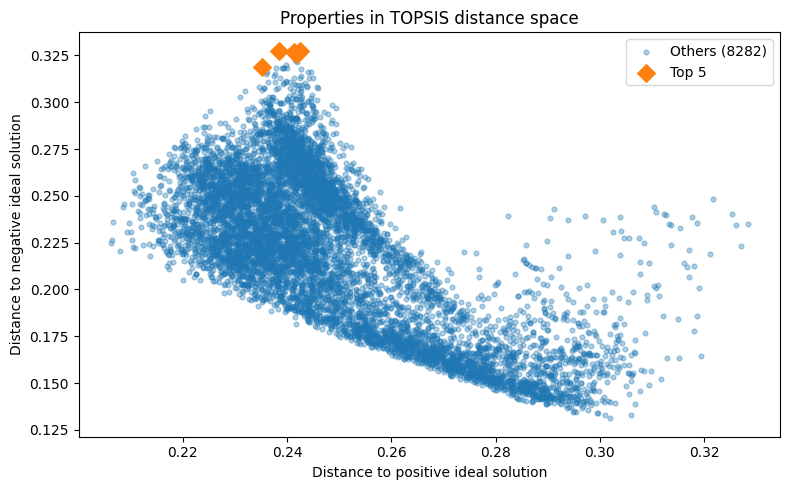

In [59]:
# 1) Inferir columnas dinámicas (log o no)
price_col, rent_col = _infer_price_cols(res_log)

# 2) Definir criterios / costos igual que en tu ranker
criteria = [
    price_col,                      # COST
    "total_m2_usage_processed",     # BENEFIT
    "n_of_rooms_processed",         # BENEFIT
    "n_of_bathrooms_processed",     # BENEFIT
    "n_of_parking_spaces_processed",# BENEFIT
    "n_of_storage_rooms_processed", # BENEFIT
    "terrace","laundry_rooms","swimming_pool","multiused_room","gym_room",
    "distance_subway",              # COST (si usas distancia real)
    # si usas dummy de metro (0/1) NO lo pongas en costos
    "days_since_publication",       # COST
    rent_col                        # COST
    # agrega "closest_subway_m2" si la usas como distancia real (costo)
    # o "closest_subway_dummy" si binaria (beneficio)
]

cost_criteria = {
    price_col,
    "distance_subway",
    "days_since_publication",
    rent_col
    # incluye "closest_subway_m2" aquí SOLO si es distancia continua
}

# 3) Pesos base y mapeo a columnas dinámicas
weights_base = {
    "total_price": 0.30,
    "total_m2_usage_processed": 0.21,
    "n_of_rooms_processed": 0.07,
    "n_of_bathrooms_processed": 0.07,
    "n_of_parking_spaces_processed": 0.03,
    "n_of_storage_rooms_processed": 0.03,
    "terrace": 0.01,
    "laundry_rooms": 0.01,
    "swimming_pool": 0.01,
    "multiused_room": 0.01,
    "gym_room": 0.01,
    "distance_subway": 0.06,
    "days_since_publication": 0.05,
    "rent_price": 0.10
}
weights = {}
for k, v in weights_base.items():
    if k == "total_price":
        weights[price_col] = v
    elif k == "rent_price":
        weights[rent_col] = v
    else:
        weights[k] = v

# 4) Calcular distancias + score y graficar
space = compute_topsis_space(res_log, criteria, cost_criteria, weights_dict=weights,
                             score_col="topsis_score")

plot_topsis_space(space, score_col="topsis_score", top_k=5,
                  title="Properties in TOPSIS distance space")


**¿Como mido los resultados??**

Aquí se plantean algunos elementos para medir los resultados de los ranking, 
con el efecto logarítmico y sin él.  
Estos indicadores buscan responder:

1. Si el orden cambia mucho al usar log o no.  
2. Cuánto se parecen los top-k de las dos soluciones.  
3. Qué propiedades suben o bajan en el ranking.  
4. Qué tan grande es la diferencia en los scores.


In [150]:
import numpy as np
import pandas as pd
from scipy.stats import spearmanr, kendalltau

# 1) Corre ambos rankings con la MISMA data de entrada
res_no_log = ranker(df_sales, with_log_scale=False, top_k=50)["ranked_all"].copy()
res_log    = ranker(df_sales, with_log_scale=True,  top_k=50)["ranked_all"].copy()

# Nota: ranker retorna 'topsis_score' como columna de score
res_no_log.rename(columns={"topsis_score": "score_no_log"}, inplace=True)
res_log.rename(columns={"topsis_score": "score_log"}, inplace=True)

# 2) Alinea por un id estable (aquí uso 'url'; si tuvieras un id único mejor, úsalo)
merged = (
    res_no_log[["url", "score_no_log"]]
    .merge(res_log[["url", "score_log"]], on="url", how="inner")
)

print(f"Filas comparables: {len(merged):,}")

# 3) Correlaciones entre scores (Spearman y Kendall)
rho,  p_rho  = spearmanr(merged["score_no_log"], merged["score_log"])
tau,  p_tau  = kendalltau(merged["score_no_log"], merged["score_log"])
print(f"Spearman ρ: {rho:.3f} (p={p_rho:.3g})")
print(f"Kendall  τ: {tau:.3f} (p={p_tau:.3g})")

# 4) Overlap del top-k (elige tu k)
k = 20
topk_no_log_urls = set(res_no_log.nlargest(k, "score_no_log")["url"])
topk_log_urls    = set(res_log.nlargest(k, "score_log")["url"])

inter = topk_no_log_urls & topk_log_urls
union = topk_no_log_urls | topk_log_urls
jacc  = (len(inter) / len(union)) if union else np.nan

print(f"Top-{k} overlap: {len(inter)}/{len(union)}  |  Jaccard: {jacc:.3f}")

# 5) Cambios de posición dentro del top-k combinado
def add_rank(df, score_col, out_col):
    out = df[["url", score_col]].copy()
    # Ranking descendente: mayor score => mejor posición (1 es mejor)
    out[out_col] = out[score_col].rank(method="min", ascending=False).astype(int)
    return out[["url", out_col]]

ranks_no_log = add_rank(res_no_log, "score_no_log", "rank_no_log")
ranks_log    = add_rank(res_log,    "score_log",    "rank_log")

rank_changes = (
    ranks_no_log.merge(ranks_log, on="url", how="inner")
    .assign(delta_rank=lambda x: x["rank_no_log"] - x["rank_log"])
    .sort_values("rank_log")
)

# Muestra cómo cambian posiciones en el top-k de la versión con log
view = rank_changes[rank_changes["rank_log"] <= k].copy()
print("\nCambios de posición (negativo = cayó con log, positivo = subió):")
print(view.head(20).to_string(index=False))

# 6) (Opcional) Métricas rápidas de resumen
if len(merged) > 0:
    abs_diff = (merged["score_log"] - merged["score_no_log"]).abs().mean()
    print(f"\nΔ medio absoluto de scores: {abs_diff:.4f}")



Filas comparables: 15,252
Spearman ρ: 0.470 (p=0)
Kendall  τ: 0.326 (p=0)
Top-20 overlap: 0/40  |  Jaccard: 0.000

Cambios de posición (negativo = cayó con log, positivo = subió):
                                                                                                                                                         url  rank_no_log  rank_log  delta_rank
                                                   https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/departamento-en-toro-mazotte/31089903         8172         1        8171
                                 https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/departamento-estudio-en-venta-estacion-central/31033747         8803         2        8801
                                                  https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/home-studio-6-de-rentabilidad/30898631         9124         3        9121
                                   https://www.yapo.

**Correlaciones**

Spearman ρ = 0.470

Kendall τ = 0.326

Son valores moderados-bajos. Significa que el orden relativo de las propiedades cambia bastante al aplicar la transformación logarítmica. Si fueran >0.8, podrías decir que el ranking se mantiene; acá hay bastante diferencia.

***Overlap del Top-20**

Overlap = 0/40

Jaccard = 0.000

No hay ninguna propiedad en común en el top-20 entre la versión log y la versión sin log. Es una señal muy fuerte de que la transformación altera radicalmente qué propiedades aparecen como las “mejores”.

**Diferencia en scores**

Δ medio absoluto de scores: 0.1104
(bastante relevante, considerando que los scores suelen ir de 0 a 1).

Conclusion: No es solo un cambio cosmético en los puntajes: los valores cambian lo suficiente para reordenar muchas filas.

## Crédito Hipotecario

En esta parte se aplicaron supuestos para estimar el monto máximo que el banco podría otorgar.  
**Los datos son:**

1. **Renta mensual**: $3.000.000
2. **Tasa de interés anual**: 4.7%
3. **Plazo**: 30 años
4. **Tasa mensual**: r = 4.36% / 12

La tasa anual se obtiene desde el banco central, que publica mensualmente la tasa de credito hipotecarios en Chile. 


Tasa Anual Credito Hipotecarios: https://si3.bcentral.cl/Siete/ES/Siete/Cuadro/CAP_DYB/MN_TASA_INTERES_09/TSF_27A/T5224

In [207]:
def max_property_price(
    income_monthly: float,
    r_monthly: float,   # tasa mensual (ej: 0.047/12)
    n_years: int,      # plazo en meses (ej: 30*12)
    max_div_pct: float = 0.25,  # 25% del ingreso
    down_payment: float = 0.0   # pie en CLP
) -> dict:
    """
    Calcula el monto máximo de crédito y el precio máximo de propiedad
    dado un tope de dividendo como % del ingreso mensual.
    """
    # Tope de dividendo mensual
    P = income_monthly * max_div_pct

    # Factor financiero de anualidad: (1 - (1+r)^-n) / r
    if r_monthly == 0:
        annuity_factor = n_years * 12
    else:
        annuity_factor = (1 - (1 + r_monthly) ** (-n_years * 12)) / r_monthly

    # Monto máximo de crédito que soporta ese dividendo
    max_credit = P * annuity_factor

    # Precio máximo = crédito + pie
    max_price = max_credit + down_payment

    return {
        "tope_dividendo_mensual": P,
        "factor_anualidad": annuity_factor,
        "max_credito": max_credit,
        "precio_maximo": max_price,
    }

In [208]:
income_monthly= 3000000
r_monthly= 0.0436/12
n_years= 30*12
max_div_pct= 0.25
down_payment= 0.0   

results = max_property_price(income_monthly, r_monthly, n_years, max_div_pct, down_payment)
results



{'tope_dividendo_mensual': 750000.0,
 'factor_anualidad': 275.2293146102439,
 'max_credito': 206421985.9576829,
 'precio_maximo': 206421985.9576829}

In [209]:
total_max_price = results["precio_maximo"]
total_max_price


206421985.9576829

In [210]:
def ranker_with_filters(
    df: pd.DataFrame,
    with_log_scale: bool = False,
    top_k: int = 5,
    number_of_rooms: int = 3,
    max_price: float = 1000000000,
    public_date_min: str = '2024-01-01',
    comuna: str = 'Santiago'
):
    """
    Rankea propiedades con TOPSIS. Si `with_log_scale=True`, transforma
    `total_price` y `rent_price` con log1p antes del escalado (como COST).

    Params
    ------
    df : DataFrame con columnas requeridas
    with_log_scale : bool -> aplicar log1p a columnas de precios
    top_k : int -> tamaño del top-k si luego quisieras return_all=False
    """

    # --- 0) Chequeo rápido ---
    if df.empty:
        print("Warning: No properties found after applying filters")
        return {"ranked_all": pd.DataFrame()}

    df = df[df['comuna'] == comuna]

    # --- 1) Selección de columnas de trabajo ---
    columns = [
        'n_of_rooms_processed',
        'n_of_bathrooms_processed',
        'n_of_parking_spaces_processed',
        'n_of_storage_rooms_processed',
        'total_m2_usage_processed',
        'furnished',
        'terrace',
        'elevator',
        'laundry_rooms',
        'swimming_pool',
        'multiused_room',
        'gym_room',
        'distance_subway',
        'closest_subway_m2',
        'total_price',
        'public_date',
        'url',
        'rent_price'
    ]
    df = df[columns].copy()
    df = df[df['n_of_rooms_processed'] == number_of_rooms]
    df = df[df['total_price'] <= max_price]
    df = df[df['public_date'] >= public_date_min]

    # --- 2) Limpieza / tipado ---
    # binarios 0/1
    for c in ["terrace","laundry_rooms","swimming_pool","multiused_room","gym_room"]:
        if df[c].dtype == "O":
            df[c] = (df[c].astype(str).str.strip().str.lower()
                     .map({"true":1,"1":1,"yes":1,"si":1,"sí":1,"y":1,"t":1,
                           "false":0,"0":0,"no":0,"n":0}))
        df[c] = pd.to_numeric(df[c], errors="coerce").fillna(0).astype(float)

    # numéricos
    num_cols = [
        "n_of_rooms_processed",
        "n_of_bathrooms_processed",
        "n_of_parking_spaces_processed",
        "n_of_storage_rooms_processed",
        "total_m2_usage_processed",
        "distance_subway",
        "closest_subway_m2",
        "total_price",
        "rent_price"
    ]
    for c in num_cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")

    # fechas -> days_since_publication (COST)
    df["public_date"] = pd.to_datetime(df["public_date"], errors="coerce", utc=True)
    max_date = df["public_date"].max()
    df["days_since_publication"] = (max_date - df["public_date"]).dt.days
    df["days_since_publication"] = df["days_since_publication"].fillna(
        df["days_since_publication"].max()
    )

    # esenciales
    df["total_m2_usage_processed"] = df["total_m2_usage_processed"].replace({0: np.nan})
    df = df.dropna(subset=["total_price","total_m2_usage_processed"])

    # --- 3) Posible transformación log ---
    # Si activas log, creamos columnas *_t y las usamos en criteria/costs/pesos
    if with_log_scale:
        df["total_price_t"] = np.log1p(df["total_price"].clip(lower=0))
        df["rent_price_t"]  = np.log1p(df["rent_price"].clip(lower=0))
        price_col = "total_price_t"
        rent_col  = "rent_price_t"
    else:
        price_col = "total_price"
        rent_col  = "rent_price"

    # --- 4) Criterios / costos / pesos ---
    criteria = [
        price_col,                      # COST
        "total_m2_usage_processed",     # BENEFIT
        "n_of_rooms_processed",         # BENEFIT
        "n_of_bathrooms_processed",     # BENEFIT
        "n_of_parking_spaces_processed",# BENEFIT
        "n_of_storage_rooms_processed", # BENEFIT
        "terrace","laundry_rooms","swimming_pool","multiused_room","gym_room",
        "distance_subway",              # COST
        "closest_subway_m2",            # COST (si es distancia)
        "days_since_publication",       # COST
        rent_col                        # COST
    ]

    cost_criteria = [
        price_col,
        "distance_subway",
        "days_since_publication",
        rent_col
    ]

    # pesos: mapea nombre dinámico (price_col / rent_col)
    weights_base = {
        "total_price": 0.2,
        "total_m2_usage_processed": 0.25,
        "n_of_rooms_processed": 0.13,
        "n_of_bathrooms_processed": 0.04,
        "n_of_parking_spaces_processed": 0.03,
        "n_of_storage_rooms_processed": 0.03,
        "terrace": 0.01,
        "laundry_rooms": 0.01,
        "swimming_pool": 0.01,
        "multiused_room": 0.01,
        "gym_room": 0.01,
        "distance_subway": 0.06,
        "closest_subway_m2": 0.03,
        "days_since_publication": 0.05,
        "rent_price": 0.10
    }
    # adaptar claves si usamos *_t
    weights = {}
    for k, v in weights_base.items():
        if k == "total_price":
            weights[price_col] = v
        elif k == "rent_price":
            weights[rent_col] = v
        else:
            weights[k] = v

    # --- 5) Rank con TOPSIS (usa tu rank_properties existente) ---
    ranked_all = rank_properties(
        df,
        criteria=criteria,
        weights=weights,
        cost_criteria=cost_criteria,
        method="topsis",
        top_k=top_k,
        return_all=True,
        score_col="topsis_score"
    )

    return {"ranked_all": ranked_all}


In [211]:
results = ranker_with_filters(df_sales, with_log_scale=True, top_k=5, number_of_rooms=3, max_price=total_max_price, public_date_min='2025-03-07', comuna='Providencia')
results['ranked_all'][[
    'total_price',
    'topsis_score',
    'n_of_rooms_processed',
    'n_of_bathrooms_processed',
    'n_of_parking_spaces_processed',
    'n_of_storage_rooms_processed',
    'total_m2_usage_processed',
    'public_date',
    'url'
]].head(10).values




array([[170000000.0, 0.8774486889003597, 3, 2, 1, 1, 91.0,
        Timestamp('2025-08-08 00:00:00+0000', tz='UTC'),
        'https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/amplio-y-conectado-departamento-para-remodelar/31136850'],
       [165408894.0, 0.755627512688749, 3, 2, 0, 0, 85.0,
        Timestamp('2025-07-29 00:00:00+0000', tz='UTC'),
        'https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/metro-santa-isabel-3-dormitorios-2-banos-109861/31080010'],
       [170000000.0, 0.7232020927425837, 3, 2, 0, 1, 84.0,
        Timestamp('2025-07-06 00:00:00+0000', tz='UTC'),
        'https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/departamento-antonio-varas-av-nueva-providencia/30956048'],
       [181162122.0, 0.7152474255141584, 3, 2, 0, 0, 90.0,
        Timestamp('2025-08-23 00:00:00+0000', tz='UTC'),
        'https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/hermoso-depto-en-plaza-jacaranda-providencia/31083

**Simplifiquemos el problema**

¿Qué pasa si solo seleccion los dpto en base a filtros basicos, como cualquier pagina web?. 

Hagamoslo.

In [212]:
df_sales_filter = df_sales[df_sales['comuna'] == 'Providencia']
df_sales_filter = df_sales_filter[df_sales_filter['n_of_rooms_processed'] == 3]
df_sales_filter = df_sales_filter[df_sales_filter['total_price'] <= total_max_price]
df_sales_filter = df_sales_filter[df_sales_filter['public_date'] >= '2025-03-07']
df_sales_filter = df_sales_filter.sort_values('total_price', ascending=False)
df_sales_filter[[
    'total_price',
    'n_of_rooms_processed',
    'n_of_bathrooms_processed',
    'n_of_parking_spaces_processed',
    'n_of_storage_rooms_processed',
    'total_m2_usage_processed',
    'public_date',
    'url'
]].head(10).values



array([[204791964.0, 3, 2, 0, 0, 94.0, '2025-08-17',
        'https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/departamento-duplex-antonio-varas/31184257'],
       [204791964.0, 3, 2, 0, 0, 83.0, '2025-08-12',
        'https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/remodelado-departamento-antiguo-112287/31156844'],
       [202232064.45, 3, 2, 1, 1, 65.0, '2025-07-31',
        'https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/bilbao-nor-oriente/31093830'],
       [198000000.0, 3, 2, 0, 0, 88.0, '2025-08-26',
        'https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/venta-departamento-3hab-2ba-providencia/31233639'],
       [196915350.0, 3, 2, 0, 1, 91.0, '2025-07-25',
        'https://www.yapo.cl/bienes-raices-venta-de-propiedades-apartamentos/en-venta-duplex-en-el-corazon-de-providencia/30952974'],
       [196521519.3, 3, 2, 0, 0, 78.0, '2025-08-22',
        'https://www.yapo.cl/bienes-raices-venta-de-propied

In [159]:
df_sales.columns

Index(['index', 'ref_id', 'comuna', 'url', 'type_house', 'type_property',
       'type_usage_property', 'type_location', 'latitude', 'longitude', 'web',
       'h3_center', 'res', 'n_of_rooms_processed', 'n_of_bathrooms_processed',
       'n_of_parking_spaces_processed', 'n_of_storage_rooms_processed',
       'common_expenses_processed', 'expenditure_of_contributions_processed',
       'total_m2_usage_processed', 'furnished', 'terrace', 'elevator',
       'laundry_rooms', 'swimming_pool', 'multiused_room', 'gym_room',
       'distance_subway', 'closest_subway_m2', 'total_price', 'public_date',
       'created_date', 'rent_price'],
      dtype='object')